In [1]:
import pandas as pd
import scipy
import matplotlib.pyplot as plt
from utils.data_loading import load_disruption_distance, load_papers
import numpy as np
import utils
from tqdm import tqdm
import matplotlib.ticker as mticker
import matplotlib
import matplotlib.font_manager as font_manager
from sklearn.decomposition import PCA
import matplotlib.colors as mcolors

from matplotlib.lines import Line2D
from sklearn.neighbors import NearestNeighbors




In [2]:
font_path = 'helvetica.ttf'
font_manager.fontManager.addfont(font_path)

prop = font_manager.FontProperties(family='Helvetica')

# Future Vectors

## Data Loading

In [ ]:
net = scipy.sparse.load_npz("/data/sg/munjkim/APS/original/citation_net.npz")
citations = np.array(net.sum(axis=0))[0]
references = np.array(net.sum(axis=1)).reshape((1,-1))[0]

In [3]:
papers_df = load_papers('/data/sg/munjkim/APS/paper_table.csv')
papers_df.head()

,paper_id,doi,year,date,journal_code,title,PACS1,PACS2,PACS3,PACS4,PACS5,category
0,0,10.1103/PhysRev.1.124,1913.0,1913-02-01,PR,An Absolute Determination of the Viscosity of Air,NaN,NaN,NaN,NaN,NaN,NaN
1,1,10.1103/PhysRev.1.16,1913.0,1913-01-01,PR,The Velocity of Electrons in the Photo-electri...,NaN,NaN,NaN,NaN,NaN,NaN
2,2,10.1103/PhysRev.1.218,1913.0,1913-03-01,PR,Brownian Movements in Gases at Low Pressures,NaN,NaN,NaN,NaN,NaN,NaN
3,3,10.1103/PhysRev.1.237,1913.0,1913-03-01,PR,Proceedings of the American Physical Society,NaN,NaN,NaN,NaN,NaN,NaN
4,4,10.1103/PhysRev.1.259,1913.0,1913-04-01,PR,The Annealing of Steel in an Alternating Magne...,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
in_vec = np.load('/data/sg/munjkim/APS/original/100_5_q_1_ep_1_bs_1024_embedding/in.npy')
out_vec = np.load('/data/sg/munjkim/APS/original/100_5_q_1_ep_1_bs_1024_embedding/out.npy')

In [5]:
papers_df['original_100_5_q_1_ep_1_bs_1024_embedding_distance_in_vec'] = list(in_vec)
papers_df['original_100_5_q_1_ep_1_bs_1024_embedding_distance_out_vec'] = list(out_vec)


In [9]:
papers_df['citations'] = papers_df['paper_id'].apply(lambda x: citations[x])
papers_df['references'] = papers_df['paper_id'].apply(lambda x: references[x])
papers_df = papers_df[papers_df['citations']>4]
# papers_df = papers_df[papers_df['references']>0]

In [10]:
papers_df = papers_df[papers_df['year']<2017]

## PCA Projection

In [13]:

pca_model = PCA(n_components=3)

pca_result_out = pca_model.fit_transform(np.stack(list(papers_df['original_100_5_q_1_ep_1_bs_1024_embedding_distance_out_vec']), axis=0))


## PACS classification

In [8]:
def making_pacs_set(row):
    pacs_set = set()
    
    
    def add_valid_pacs_code(pacs_code):
        if pacs_code == pacs_code: 
            pacs_part = pacs_code.split('.')[0]
            if len(pacs_part) == 2 and pacs_part.isdigit(): 
                pacs_set.add(pacs_part)

   
    add_valid_pacs_code(row['PACS1'])
    add_valid_pacs_code(row['PACS2'])
    add_valid_pacs_code(row['PACS3'])
    add_valid_pacs_code(row['PACS4'])
    add_valid_pacs_code(row['PACS5'])
    
    return pacs_set



In [9]:
papers_df['PACS_SET'] = papers_df.apply(lambda x: making_pacs_set(x), axis=1 )

In [10]:
def get_pacs_category(pacs_set):
    if not pacs_set:
        return -1 
    pacs_code = min(pacs_set)  
    pacs_category = int(pacs_code) // 10  
    return pacs_category


papers_df['PACS_CATEGORY'] = papers_df['PACS_SET'].apply(get_pacs_category)


category_colors = {i: color for i, color in enumerate(mcolors.TABLEAU_COLORS)}


In [11]:
papers_df = papers_df.reset_index(drop=True)

## Closest Paper Pairs 

In [35]:

original_embeddings = np.stack(list(papers_df['original_100_5_q_1_ep_1_bs_1024_embedding_distance_out_vec']), axis=0)


knn_model = NearestNeighbors(n_neighbors=2, algorithm='auto', metric='cosine')


knn_model.fit(original_embeddings)

distances, indices = knn_model.kneighbors([original_embeddings[0]])



#### Simultaneous disruptions in Nobel Prize-winning papers

In [36]:
doi_list = ['10.1103/PhysRevLett.13.508', # higgs
           '10.1103/PhysRevLett.13.321', #englert
           '10.1103/PhysRevLett.13.585', #  Guralnik
            
           '10.1103/PhysRevLett.33.1406', # Augstin
            # '10.1103/PhysRevLett.33.1453' , # Abrams
            '10.1103/PhysRevLett.33.1404', #aubert
            
            '10.1103/PhysRevLett.30.1343',#Gross
            '10.1103/PhysRevLett.30.1346',# Politzer
            
            '10.1103/PhysRevLett.23.930', # Bloom
            '10.1103/PhysRevLett.23.935', # Breidenbach
            
            # '10.1103/PhysRev.136.B864', # hohenberg
            # '10.1103/PhysRev.140.A1133' # kohn sham

            
           ] 

In [17]:
All_annotation_simultaneou_papers = pd.read_csv('../data/derived/All_80_annotation_simultaneou_papers')

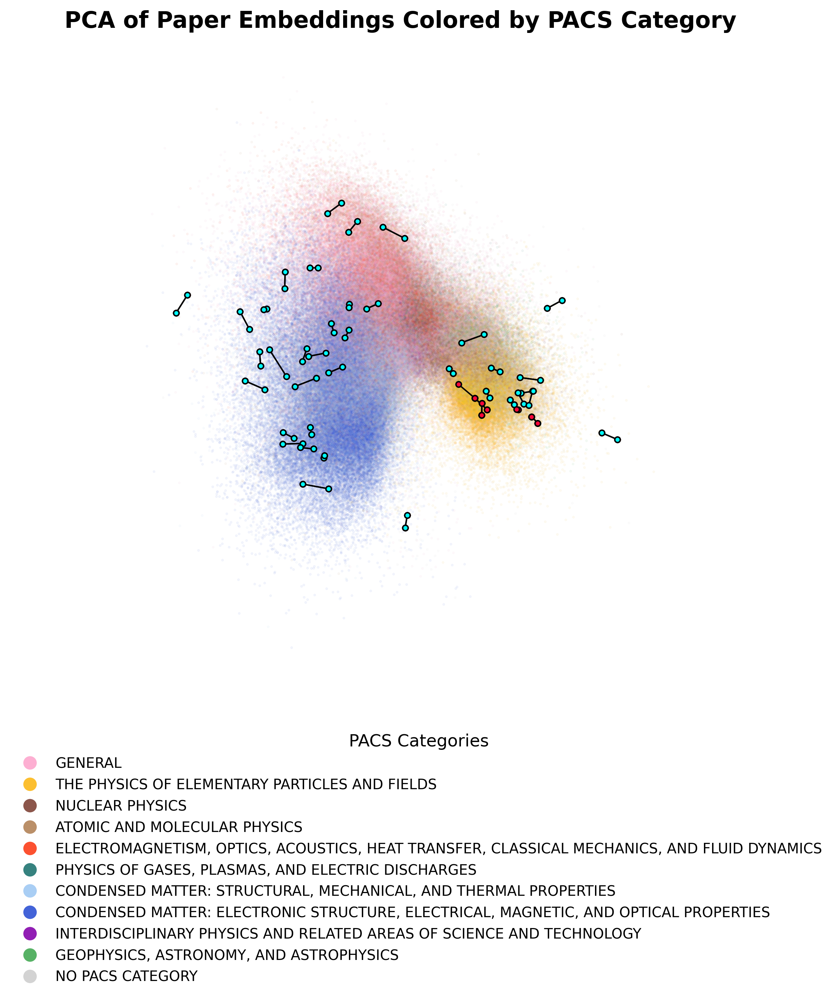

In [44]:
category_colors = {
    0: '#FDAFD2',
    1: '#FCBF30',
    2: '#8c564b',
    3: '#ba8f68',
    4: '#FC5130' ,
    5:  '#36827F', 
    6:  '#A9CEF4',
    7: '#4363d8', 
    8: '#911eb4' ,  
    9: '#57B265', 
}
category_colors[-1] = '#D3D3D3' 


plt.figure(figsize=(8, 8), dpi=300)

valid_papers_df = papers_df.dropna(subset=['PACS_CATEGORY'])
color_list = valid_papers_df['PACS_CATEGORY'].map(category_colors)


sc = plt.scatter(pca_result_out[valid_papers_df.index, 1], pca_result_out[valid_papers_df.index, 2], 
                 c=color_list, s=2, alpha=0.05, edgecolor=None, linewidth=0.5)



highlight_color = '#DB5461'

highlighted_embeddings = papers_df[papers_df['doi'].apply(lambda x: x in set(All_annotation_simultaneou_papers['doi']))].index  # The indices for highlighted papers


for point in highlighted_embeddings:
    distances, indices = knn_model.kneighbors([original_embeddings[point]])  # Get k-nearest neighbors

    for i, neighbor in enumerate(indices[0]):

            plt.scatter(pca_result_out[point, 1], pca_result_out[point, 2], c='cyan',s= 15,edgecolors='black',zorder=2) # Politzer
            plt.plot([pca_result_out[point, 1], pca_result_out[neighbor, 1]],
                     [pca_result_out[point, 2], pca_result_out[neighbor, 2]]
                    , lw=1,alpha=1,color = 'black',zorder = 1)  # Black line, width 0.5
            
known_color = '#FF073A'

plt.scatter(pca_result_out[272480, 1], pca_result_out[272480, 2], c=known_color,s= 15,edgecolors='black',zorder = 2) # augstin

plt.scatter(pca_result_out[272479, 1], pca_result_out[272479, 2], c=known_color,s= 15,edgecolors='black',zorder = 2) # Abram

plt.scatter(pca_result_out[272480, 1], pca_result_out[272480, 2], c=known_color,s= 15,edgecolors='black',zorder = 2) # augstin
# plt.scatter(pca_result_out[272492, 1], pca_result_out[272492, 2], c='#DB5461',s= 30,edgecolors='black') # Abram


plt.scatter(pca_result_out[271515, 1], pca_result_out[271515, 2], c=known_color,s= 15,edgecolors='black',zorder = 2) # Politzer
plt.scatter(pca_result_out[271514, 1], pca_result_out[271514, 2], c=known_color,s= 15,edgecolors='black',zorder = 2) # Gross

plt.scatter(pca_result_out[265709, 1], pca_result_out[265709, 2], c=known_color,s= 15,edgecolors='black',zorder = 2) # Higgs
plt.scatter(pca_result_out[265656, 1], pca_result_out[265656, 2], c=known_color,s= 15,edgecolors='black',zorder = 2) # Englert
plt.scatter(pca_result_out[265736, 1], pca_result_out[265736, 2], c=known_color,s= 15,edgecolors='black',zorder = 2) # Guralnik

plt.scatter(pca_result_out[269165, 1], pca_result_out[269165, 2], c=known_color,s= 15,edgecolors='black',zorder = 2)# Bloom
plt.scatter(pca_result_out[269166, 1], pca_result_out[269166, 2], c=known_color,s= 15,edgecolors='black',zorder = 2)# Briedenbach


highlighted_embeddings = papers_df[papers_df['doi'].apply(lambda x: x in doi_list)].index  # The indices for highlighted papers

# Draw lines connecting the highlighted points with their k-nearest neighbors
for point in highlighted_embeddings:
    distances, indices = knn_model.kneighbors([original_embeddings[point]])  # Get k-nearest neighbors
    # Draw lines only if the neighbor is one of the highlighted points
    for i, neighbor in enumerate(indices[0]):
        # if neighbor in highlighted_points:
            # Plot a line between the PCA points of 'point' and its 'neighbor'
            plt.plot([pca_result_out[point, 1], pca_result_out[neighbor, 1]],
                     [pca_result_out[point, 2], pca_result_out[neighbor, 2]],
                     lw=1,alpha=1,color = 'black',zorder = 1)  # Black line, width 0.5




# Customize legend for PACS categories
PACS_CODE_LIST = ['GENERAL',
                  'THE PHYSICS OF ELEMENTARY PARTICLES AND FIELDS',
                  'NUCLEAR PHYSICS',
                  'ATOMIC AND MOLECULAR PHYSICS',
                  'ELECTROMAGNETISM, OPTICS, ACOUSTICS, HEAT TRANSFER, CLASSICAL MECHANICS, AND FLUID DYNAMICS',
                  'PHYSICS OF GASES, PLASMAS, AND ELECTRIC DISCHARGES',
                  'CONDENSED MATTER: STRUCTURAL, MECHANICAL, AND THERMAL PROPERTIES',
                  'CONDENSED MATTER: ELECTRONIC STRUCTURE, ELECTRICAL, MAGNETIC, AND OPTICAL PROPERTIES',
                  'INTERDISCIPLINARY PHYSICS AND RELATED AREAS OF SCIENCE AND TECHNOLOGY',
                  'GEOPHYSICS, ASTRONOMY, AND ASTROPHYSICS']

legend_elements = [Line2D([0], [0], marker='o', color='w', label=PACS_CODE_LIST[i], 
                          markerfacecolor=category_colors[i], markersize=10, markeredgewidth=0.5, markeredgecolor='w') 
                   for i in range(10)]
legend_elements.append(Line2D([0], [0], marker='o', color='w', label='NO PACS CATEGORY', 
                              markerfacecolor=category_colors[-1], markersize=10, markeredgewidth=0.5, markeredgecolor='w'))


plt.legend(handles=legend_elements, title="PACS Categories", loc=(-0.2, -0.5), 
           frameon=False, fontsize=10, title_fontsize=12)


plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', alpha=0.7)
plt.tick_params(axis='both', which='major', labelsize=10)
plt.xlabel('PCA Component 2', fontsize=14, labelpad=10, fontweight='bold')
plt.ylabel('PCA Component 3', fontsize=14, labelpad=10, fontweight='bold')
plt.title('PCA of Paper Embeddings Colored by PACS Category', fontsize=16, pad=15, fontweight='bold')
plt.gca().set_aspect('equal', adjustable='box')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.axis('off')
# plt.savefig('../results/Figures/APS_PCA_FIGURE_all_simultaneous.png',bbox_inches = 'tight')

plt.show()


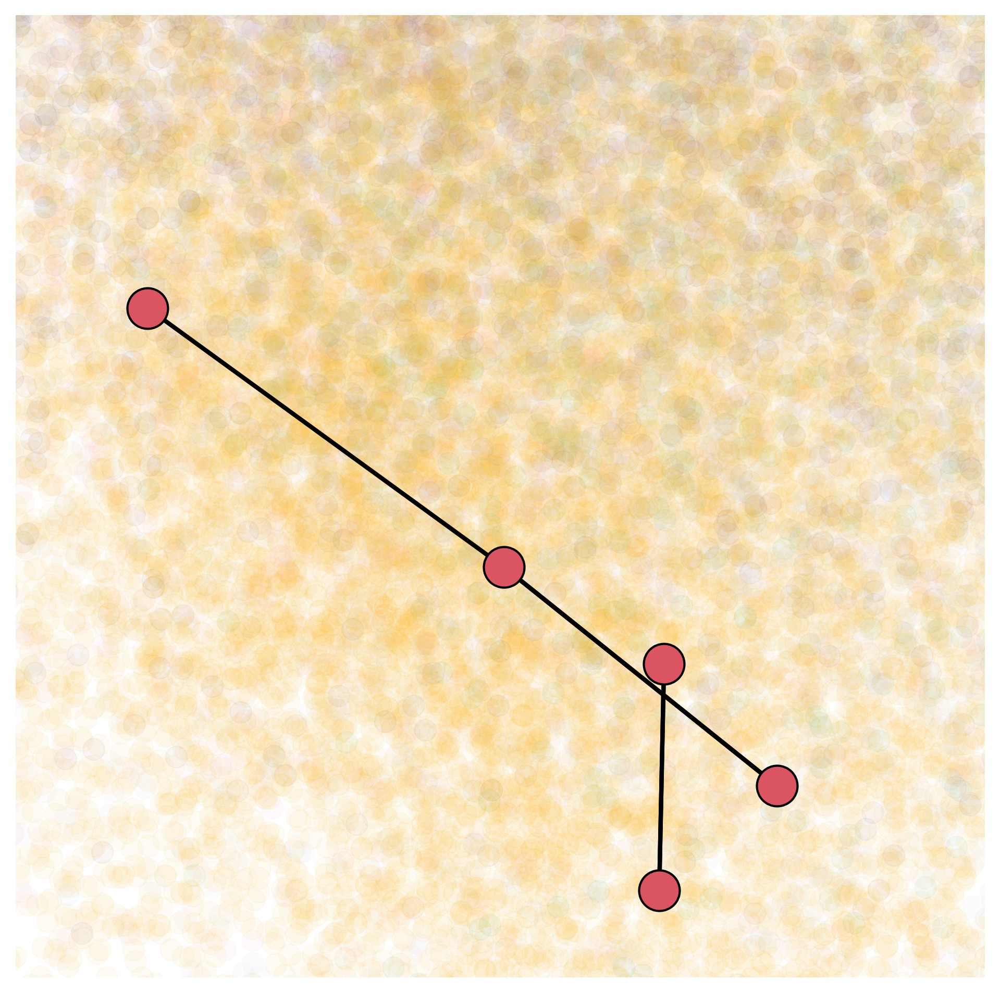

In [39]:



plt.figure(figsize=(8, 8), dpi=300)

valid_papers_df = papers_df.dropna(subset=['PACS_CATEGORY'])
color_list = valid_papers_df['PACS_CATEGORY'].map(category_colors)


sc = plt.scatter(pca_result_out[valid_papers_df.index, 1], pca_result_out[valid_papers_df.index, 2], 
                 c=color_list, s=100, alpha=0.05, edgecolor=None, linewidth=0.5)



highlighted_embeddings = papers_df[papers_df['doi'].apply(lambda x: x in doi_list)].index  # The indices for highlighted papers

# Draw lines connecting the highlighted points with their k-nearest neighbors
for point in highlighted_embeddings:
    distances, indices = knn_model.kneighbors([original_embeddings[point]])  # Get k-nearest neighbors
    # Draw lines only if the neighbor is one of the highlighted points
    for i, neighbor in enumerate(indices[0]):
        # if neighbor in highlighted_points:
            # Plot a line between the PCA points of 'point' and its 'neighbor'
            plt.plot([pca_result_out[point, 1], pca_result_out[neighbor, 1]],
                     [pca_result_out[point, 2], pca_result_out[neighbor, 2]],
                     lw=2,alpha=1,color = 'black',zorder = 1)  # Black line, width 0.5



highlight_color = '#DB5461'


# # Asympotitc
plt.scatter(pca_result_out[271515, 1], pca_result_out[271515, 2], c='#DB5461',s= 350,edgecolors='black',zorder = 2) # Politzer
plt.scatter(pca_result_out[271514, 1], pca_result_out[271514, 2], c='#DB5461',s= 350,edgecolors='black',zorder = 2) # Gross

plt.scatter(pca_result_out[265709, 1], pca_result_out[265709, 2], c='#DB5461',s= 350,edgecolors='black',zorder = 2) # Higgs
plt.scatter(pca_result_out[265656, 1], pca_result_out[265656, 2], c='#DB5461',s= 350,edgecolors='black',zorder = 2) # Englert
plt.scatter(pca_result_out[265736, 1], pca_result_out[265736, 2], c='#DB5461',s= 350,edgecolors='black',zorder = 2)# Guralnik



legend_elements = [Line2D([0], [0], marker='o', color='w', label=PACS_CODE_LIST[i], 
                          markerfacecolor=category_colors[i], markersize=10, markeredgewidth=0.5, markeredgecolor='w') 
                   for i in range(10)]



plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.axis('off')
plt.xlim(1.7,3)
plt.ylim(-2,-0.5)
# plt.savefig('../results/Figures/APS_PCA_FIGURE_politzer_higgs_zoom.png',bbox_inches = 'tight')

plt.show()


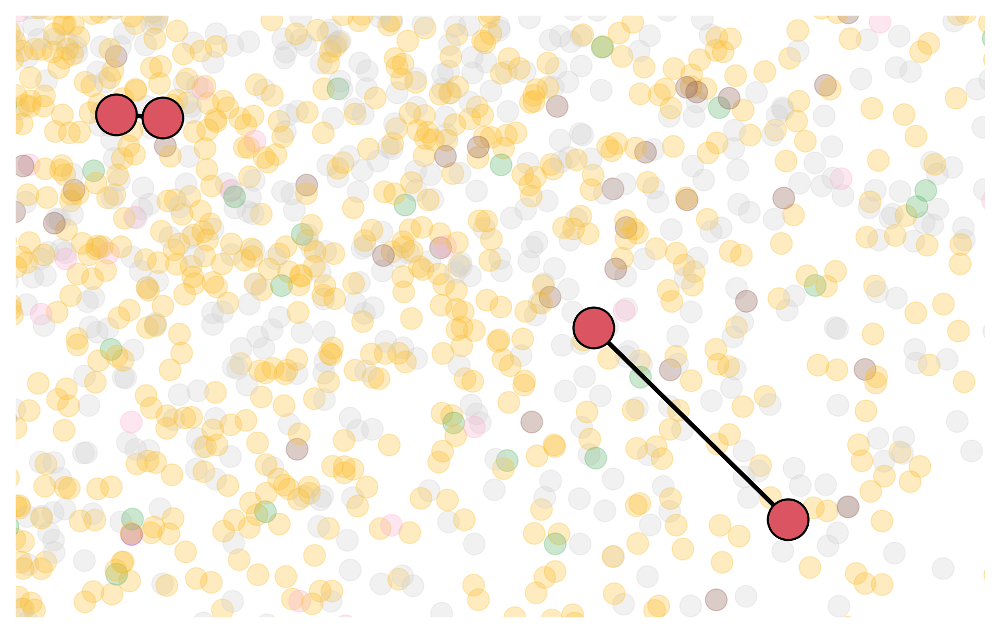

In [41]:
plt.figure(figsize=(8, 5), dpi=300)

valid_papers_df = papers_df.dropna(subset=['PACS_CATEGORY'])
color_list = valid_papers_df['PACS_CATEGORY'].map(category_colors)

sc = plt.scatter(pca_result_out[valid_papers_df.index, 1], pca_result_out[valid_papers_df.index, 2], 
                 c=color_list, s=100, alpha=0.3, edgecolor=None, linewidth=0.5)

highlighted_embeddings = papers_df[papers_df['doi'].apply(lambda x: x in doi_list)].index  # The indices for highlighted papers


for point in highlighted_embeddings:
    distances, indices = knn_model.kneighbors([original_embeddings[point]])  # Get k-nearest neighbors
    # Draw lines only if the neighbor is one of the highlighted points
    for i, neighbor in enumerate(indices[0]):
       
            plt.plot([pca_result_out[point, 1], pca_result_out[neighbor, 1]],
                     [pca_result_out[point, 2], pca_result_out[neighbor, 2]],
                     lw=2,alpha=1,color = 'black',zorder = 1)  # Black line, width 0.5



highlight_color = '#DB5461'



plt.scatter(pca_result_out[272480, 1], pca_result_out[272480, 2], c='#DB5461',s= 350,edgecolors='black',zorder = 2) # augstin
plt.scatter(pca_result_out[272479, 1], pca_result_out[272479, 2], c='#DB5461',s= 350,edgecolors='black',zorder = 2)# Abram

plt.scatter(pca_result_out[269165, 1], pca_result_out[269165, 2], c='#DB5461',s= 350,edgecolors='black',zorder = 2)# Bloom
plt.scatter(pca_result_out[269166, 1], pca_result_out[269166, 2], c='#DB5461',s= 350,edgecolors='black',zorder = 2)# Briedenbach


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.axis('off')
plt.xlim(3.5,4.4)
plt.ylim(-2.2,-1.6)
# plt.savefig('../results/Figures/APS_PCA_FIGURE_augstin_abram_zoom.png',bbox_inches = 'tight')

plt.show()


## Past Vectors 

In [7]:
net = scipy.sparse.load_npz("/data/sg/munjkim/APS/original/citation_net.npz")
citations = np.array(net.sum(axis=0))[0]
references = np.array(net.sum(axis=1)).reshape((1,-1))[0]
papers_df = load_papers('/data/sg/munjkim/APS/paper_table.csv')

in_vec = np.load('/data/sg/munjkim/APS/original/100_5_q_1_ep_1_bs_1024_embedding/in.npy')
out_vec = np.load('/data/sg/munjkim/APS/original/100_5_q_1_ep_1_bs_1024_embedding/out.npy')
papers_df['original_100_5_q_1_ep_1_bs_1024_embedding_distance_in_vec'] = list(in_vec)
papers_df['original_100_5_q_1_ep_1_bs_1024_embedding_distance_out_vec'] = list(out_vec)

papers_df['citations'] = papers_df['paper_id'].apply(lambda x: citations[x])
papers_df['references'] = papers_df['paper_id'].apply(lambda x: references[x])
papers_df = papers_df[papers_df['citations']>4]
papers_df = papers_df[papers_df['references']>0]
papers_df = papers_df[papers_df['year']<2017]

In [14]:
pca_model = PCA(n_components=3)
pca_result_in = pca_model.fit_transform(np.stack(list(papers_df['original_100_5_q_1_ep_1_bs_1024_embedding_distance_in_vec']), axis=0))


In [21]:
papers_df['PACS_SET'] = papers_df.apply(lambda x: making_pacs_set(x), axis=1 )

In [22]:
papers_df['PACS_CATEGORY'] = papers_df['PACS_SET'].apply(get_pacs_category)


category_colors = {i: color for i, color in enumerate(mcolors.TABLEAU_COLORS)}


In [12]:
papers_df = papers_df.reset_index(drop=True)

In [19]:

original_embeddings = np.stack(list(papers_df['original_100_5_q_1_ep_1_bs_1024_embedding_distance_in_vec']), axis=0)


knn_model = NearestNeighbors(n_neighbors=2, algorithm='auto', metric='cosine')


knn_model.fit(original_embeddings)

distances, indices = knn_model.kneighbors([original_embeddings[0]])



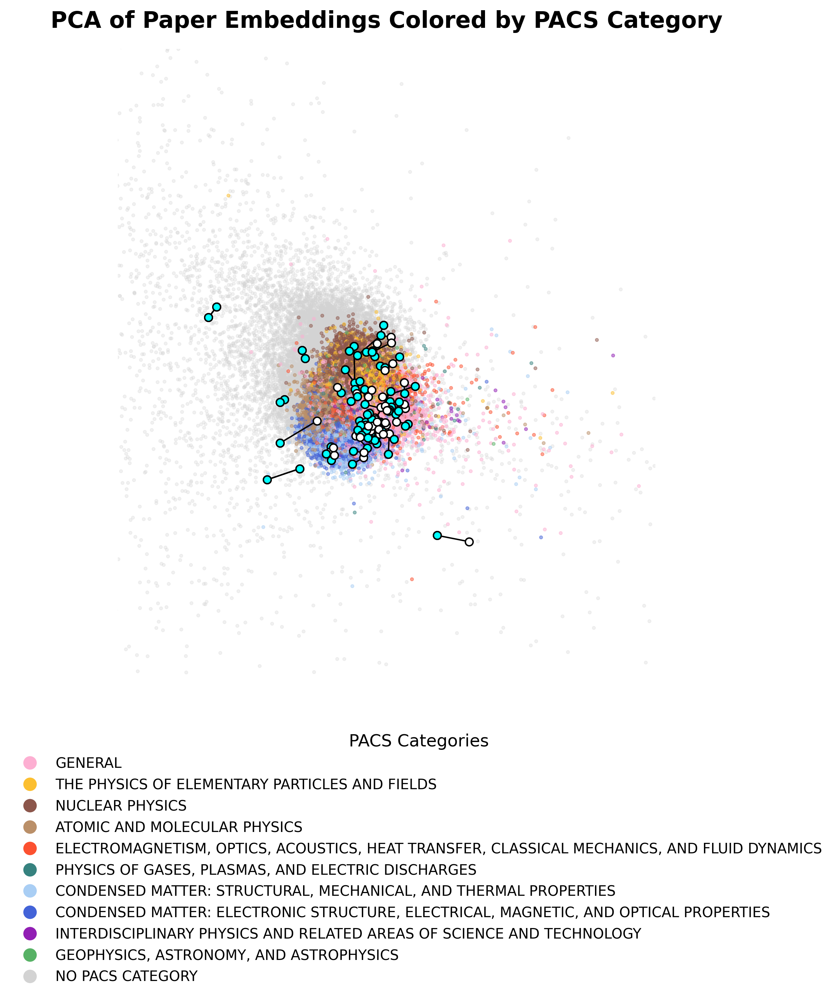

In [22]:
category_colors = {
    0: '#FDAFD2', 
    1: '#FCBF30',
    2: '#8c564b',
    3: '#ba8f68',
    4: '#FC5130' ,
    5:  '#36827F', 
    6:  '#A9CEF4',
    7: '#4363d8', 
    8: '#911eb4' ,
    9: '#57B265', 
}


category_colors[-1] = '#D3D3D3' 

plt.figure(figsize=(8, 8), dpi=300)


valid_papers_df = papers_df[papers_df['PACS_CATEGORY']==-1]
color_list = valid_papers_df['PACS_CATEGORY'].map(category_colors)

# Scatter plot of PCA results
sc = plt.scatter(pca_result_in[valid_papers_df.index, 1], pca_result_in[valid_papers_df.index, 2], 
                 c=color_list, s=5, alpha=0.3, edgecolor=None, linewidth=0.5)

valid_papers_df = papers_df[papers_df['PACS_CATEGORY']!=-1]
color_list = valid_papers_df['PACS_CATEGORY'].map(category_colors)

# Scatter plot of PCA results
sc = plt.scatter(pca_result_in[valid_papers_df.index, 1], pca_result_in[valid_papers_df.index, 2], 
                 c=color_list, s=5, alpha=0.5, edgecolor=None, linewidth=0.5)


highlight_color = '#DB5461'


highlighted_embeddings = papers_df[papers_df['doi'].apply(lambda x: x in set(All_annotation_simultaneou_papers['doi']))].index  # The indices for highlighted papers


for point in highlighted_embeddings:
    distances, indices = knn_model.kneighbors([original_embeddings[point]])  # Get k-nearest neighbors
    # Draw lines only if the neighbor is one of the highlighted points
    for i, neighbor in enumerate(indices[0]):

            plt.scatter(pca_result_in[point, 1], pca_result_in[point, 2], c='cyan',s= 30,edgecolors='black', zorder = 2) # Politzer
            
            if neighbor not in highlighted_embeddings  :
                plt.scatter(pca_result_in[neighbor, 1], pca_result_in[neighbor, 2], c='white',s= 30,edgecolors='black', zorder = 2) # Politzer
            plt.plot([pca_result_in[point, 1], pca_result_in[neighbor, 1]],
                     [pca_result_in[point, 2], pca_result_in[neighbor, 2]]
                    , lw=1,alpha=1,color = 'black', zorder = 1)  # Black line, width 0.5
            
known_color = '#FF073A'


PACS_CODE_LIST = ['GENERAL',
                  'THE PHYSICS OF ELEMENTARY PARTICLES AND FIELDS',
                  'NUCLEAR PHYSICS',
                  'ATOMIC AND MOLECULAR PHYSICS',
                  'ELECTROMAGNETISM, OPTICS, ACOUSTICS, HEAT TRANSFER, CLASSICAL MECHANICS, AND FLUID DYNAMICS',
                  'PHYSICS OF GASES, PLASMAS, AND ELECTRIC DISCHARGES',
                  'CONDENSED MATTER: STRUCTURAL, MECHANICAL, AND THERMAL PROPERTIES',
                  'CONDENSED MATTER: ELECTRONIC STRUCTURE, ELECTRICAL, MAGNETIC, AND OPTICAL PROPERTIES',
                  'INTERDISCIPLINARY PHYSICS AND RELATED AREAS OF SCIENCE AND TECHNOLOGY',
                  'GEOPHYSICS, ASTRONOMY, AND ASTROPHYSICS']

legend_elements = [Line2D([0], [0], marker='o', color='w', label=PACS_CODE_LIST[i], 
                          markerfacecolor=category_colors[i], markersize=10, markeredgewidth=0.5, markeredgecolor='w') 
                   for i in range(10)]
legend_elements.append(Line2D([0], [0], marker='o', color='w', label='NO PACS CATEGORY', 
                              markerfacecolor=category_colors[-1], markersize=10, markeredgewidth=0.5, markeredgecolor='w'))


plt.legend(handles=legend_elements, title="PACS Categories", loc=(-0.2, -0.5), 
           frameon=False, fontsize=10, title_fontsize=12)


plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', alpha=0.7)
plt.tick_params(axis='both', which='major', labelsize=10)
plt.xlabel('PCA Component 2', fontsize=14, labelpad=10, fontweight='bold')
plt.ylabel('PCA Component 3', fontsize=14, labelpad=10, fontweight='bold')
plt.title('PCA of Paper Embeddings Colored by PACS Category', fontsize=16, pad=15, fontweight='bold')
plt.gca().set_aspect('equal', adjustable='box')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.axis('off')
plt.ylim([-4.5,6])
plt.xlim([-4,5])
# plt.savefig('../results/Figures/APS_PCA_FIGURE_all_simultaneous_past_vectors_Nov20_2024.png',bbox_inches = 'tight')
plt.show()